In [1]:
from __future__ import  absolute_import
from __future__ import  division
import torch as t
from data.voc_dataset import VOCBboxDataset
# from skimage import transform as sktsf
from torchvision import transforms as tvtsf
from data import util
import numpy as np
from utils.config import opt


class Dataset:
    def __init__(self, opt, split='train', img_type='png'):
        self.opt = opt
        self.db = VOCBboxDataset(opt.voc_data_dir, split=split, img_type=img_type)

    def __getitem__(self, idx):
        ori_img, bbox, label, difficult = self.db.get_example(idx)
#         img = normalize(ori_img)
        img = ori_img
    
        return img.copy()

    def __len__(self):
        return len(self.db)

# Kitti Train

In [3]:
# Load prediction model

import os
from utils.config import opt
from model import FasterRCNNVGG16
from trainer import FasterRCNNTrainer

save_dir = './checkpoints/cars'
weight_path = 'fasterrcnn_04152235_0.7462277363985176'

faster_rcnn = FasterRCNNVGG16().cuda()
trainer = FasterRCNNTrainer(faster_rcnn).cuda()

trainer.load(os.path.join(save_dir, weight_path))


opt.caffe_pretrain=True # this model was trained from caffe-pretrained model
opt.voc_data_dir = '/media/tadenoud/DATADisk/datasets/kitti_2d_detection/VOC2012/'

Setting up a new session...
Traceback (most recent call last):
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/connection.py", line 160, in _new_conn
    (self._dns_host, self.port), self.timeout, **extra_kw)
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/util/connection.py", line 80, in create_connection
    raise err
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/util/connection.py", line 70, in create_connection
    sock.connect(sa)
ConnectionRefusedError: [Errno 111] Connection refused

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/connectionpool.py", line 603, in urlopen
    chunked=chunked)
  File "/home/tadenoud/anaconda3/envs/nn/lib/python3.7/site-packages/urllib3/connectionpool.py", line 355, in _make_request
    conn.request(method, url, **httplib_request_

Exception in user code:
------------------------------------------------------------


In [4]:
import warnings
warnings.filterwarnings("ignore", category=UserWarning) 

# Load test dataset

from data.dataset import Dataset, TestDataset
from torch.utils.data import DataLoader
from train import eval

test_dataset = TestDataset(opt, split='test')
test_dataloader = DataLoader(test_dataset,
                             batch_size=1,
                             shuffle=False,
                             pin_memory=True,
                             num_workers=opt.num_workers)

In [5]:
# Run Eval to get AP on Kitti Test

results = eval(test_dataloader, faster_rcnn, test_num=3578)
# results = eval(test_dataloader, faster_rcnn, test_num=100)

100%|██████████| 3578/3578 [07:15<00:00,  7.97it/s]


In [6]:
print(results)

{'ap': array([0.74622774]), 'map': 0.7462277363985176}


In [22]:
from tqdm.auto import tqdm

TRAIN_MODE = True

if TRAIN_MODE:
    features = []
    gt_labels = []

    pred_bboxes, pred_labels, pred_scores = list(), list(), list()
    gt_bboxes, gt_labels = list(), list()
    for ii, (imgs, sizes, gt_bboxes_, gt_labels_, gt_difficults_) in tqdm(enumerate(test_dataloader), total=len(test_dataset)):
        gt_bboxes += list(gt_bboxes_.numpy())
        gt_labels += list(gt_labels_.numpy())
        
        sizes = [sizes[0][0].item(), sizes[1][0].item()]
        pred_bboxes_, pred_labels_, pred_scores_ = faster_rcnn.predict(imgs, [sizes])
        
        pred_bboxes += pred_bboxes_
        pred_labels += pred_labels_
        pred_scores += pred_scores_

In [34]:
from model.utils.bbox_tools import bbox_iou
IOU_THRESH = 0.5

# Ground truth bboxes
print("Ground truth bboxes:", len(np.concatenate(gt_bboxes)))

# Pred bboxes
print("Pred bboxes:", len(np.concatenate(pred_bboxes)))

# Loop through results by image
bboxes_ious = list()
overlapping_bboxes = list()
correct_classification = list()

def iou(bbox, label, gt_boxes, gt_labels, iou_thresh=0.5):
    if not len(gt_labels):
        return 0, False
    try:
        ious = bbox_iou(np.array([bbox]), gt_boxes)
        best_iou = np.max(ious)
        best_label = gt_labels[np.argmax(ious)]
        
    except ValueError:
        import pdb; pdb.set_trace()
    return best_iou, best_iou > 0 and best_label == label

for gt_bbox, gt_label, pred_bbox, pred_label, pred_score in \
        zip(gt_bboxes, gt_labels, pred_bboxes, pred_labels, pred_scores):
    # Calculate if the pred bbox has an overlapping gt_bbox
    bboxes_ious.append([])
    overlapping_bboxes.append([])
    correct_classification.append([])
    for bbox, label, score in zip(pred_bbox, pred_label, pred_score):
        bbox_iou_score, correct_class = iou(bbox, label, gt_bbox, gt_label)
        
        bboxes_ious[-1].append(bbox_iou_score)
        overlapping_bboxes[-1].append(bbox_iou_score > IOU_THRESH)
        correct_classification[-1].append(correct_class)

Ground truth bboxes: 20333
Pred bboxes: 20642


In [71]:
from itertools import chain
from sklearn.metrics import roc_auc_score
from ood_metrics import auroc, fpr_at_95_tpr, detection_error

scores = [-s for s in chain(*pred_scores)]
overlap_correct = list(chain(*overlapping_bboxes))
class_correct = list(chain(*correct_classification))
both_correct = [a and b for a, b in zip(overlap_correct, class_correct)]

print("AUROC")
print("Overlap", auroc(scores, overlap_correct))
print("Class", auroc(scores, class_correct))
print("Both", auroc(scores, both_correct))
print()
print("FPR@95TPR")
print("Overlap", fpr_at_95_tpr(scores, overlap_correct))
print("Class", fpr_at_95_tpr(scores, class_correct))
print("Both", fpr_at_95_tpr(scores, both_correct))
# print()
# print("Detection Err")
# print("Overlap", detection_error(scores, overlap_correct))
# print("Class", detection_error(scores, class_correct))
# print("Both", detection_error(scores, both_correct))

AUROC
Overlap 0.08105539210123155
Class 0.21145770338724046
Both 0.07059085632998233

FPR@95TPR
Overlap 0.9993249324932493
Class 0.9988748241912799
Both 0.9994605674830078


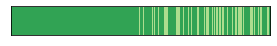

In [69]:
from metrics import barcode_plot
barcode_plot(scores, class_correct)

## What do low IoU objects look like?

[False, False]


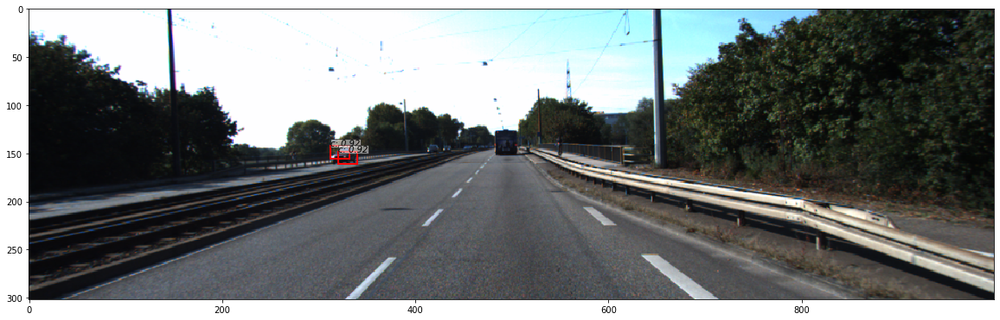

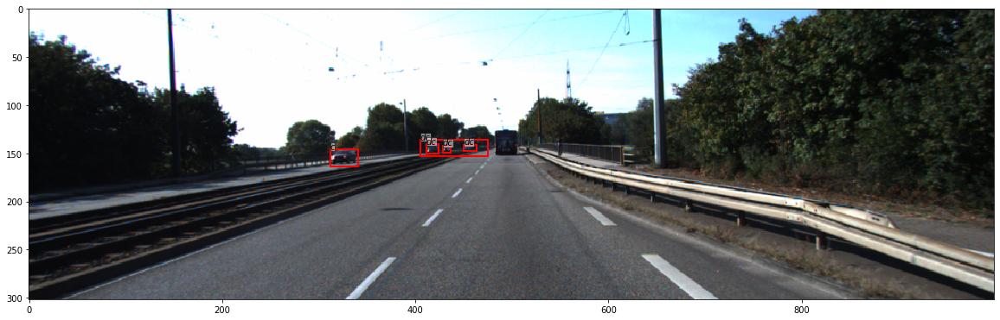

[True, False]


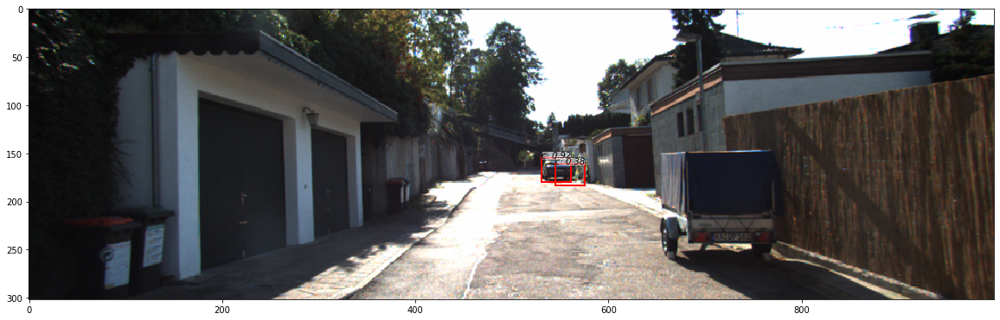

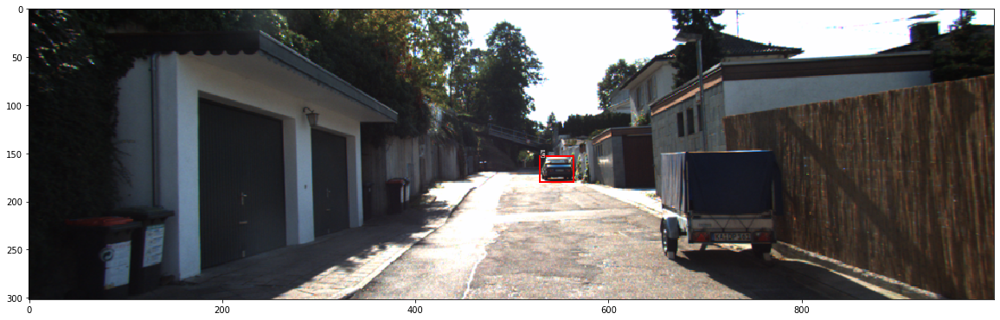

[True, True, False, False, False, False]


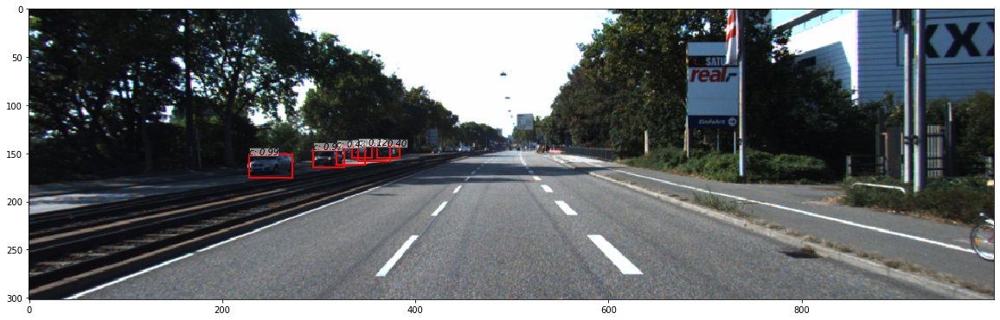

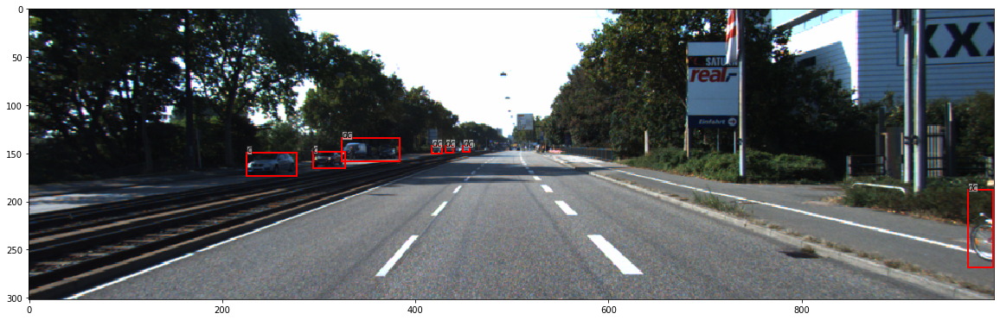

[]


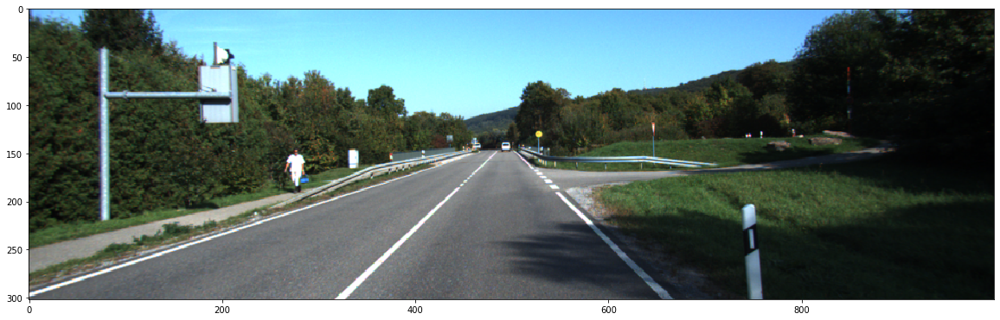

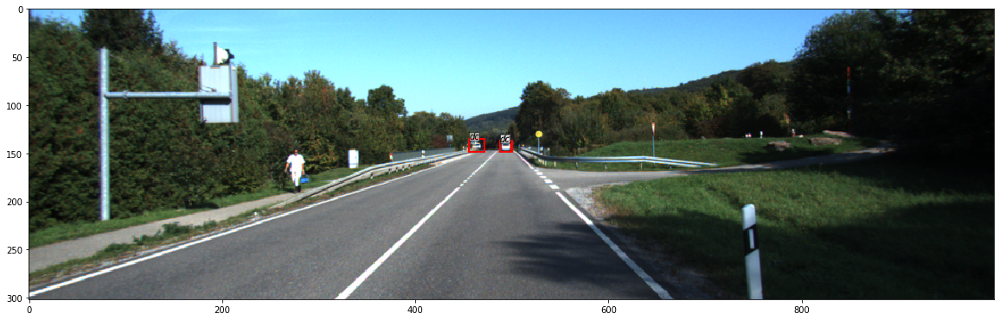

[True, True, True, False, False, False, False, False, False]


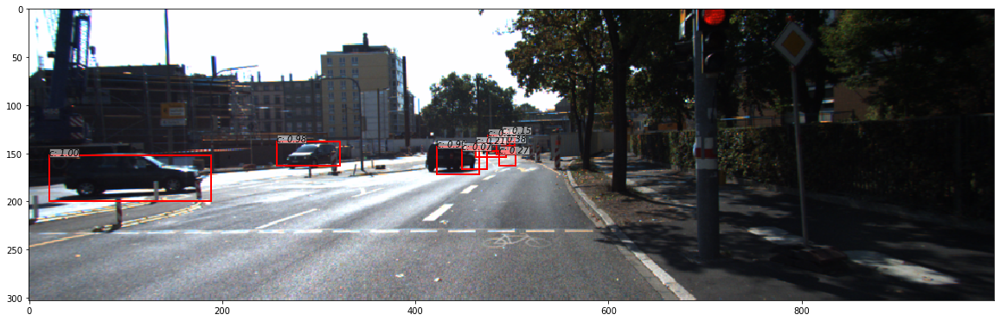

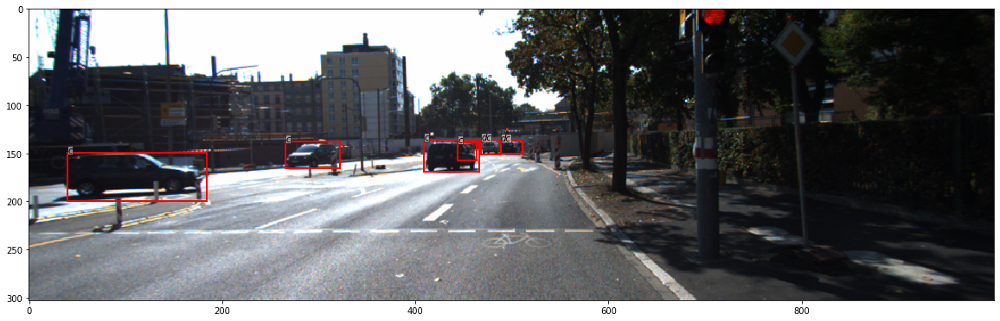

[True, True, True, True, True, True, False, False, False]


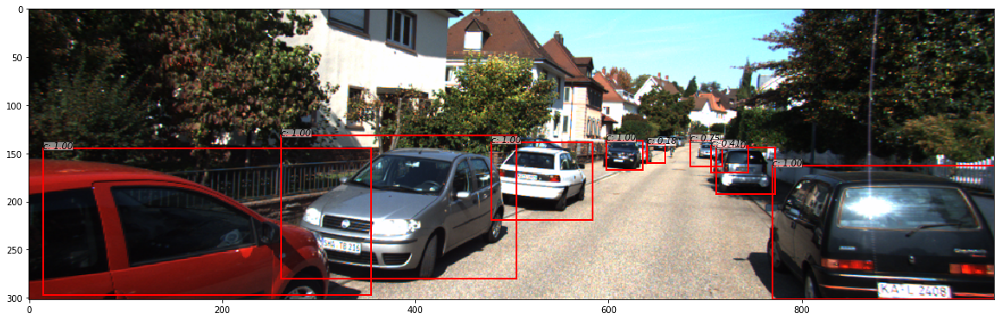

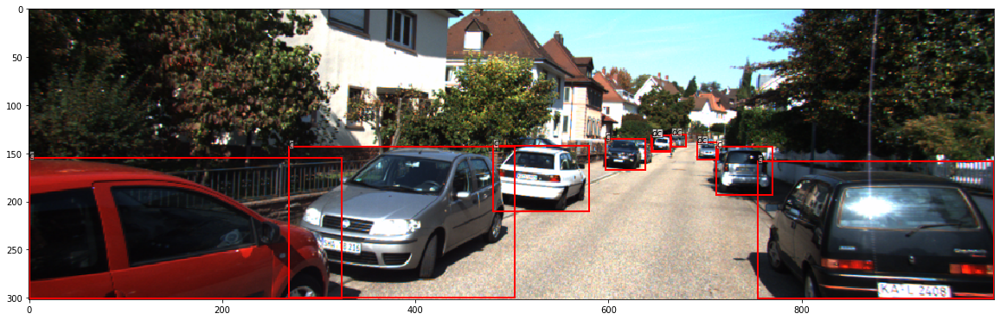

[True, False]


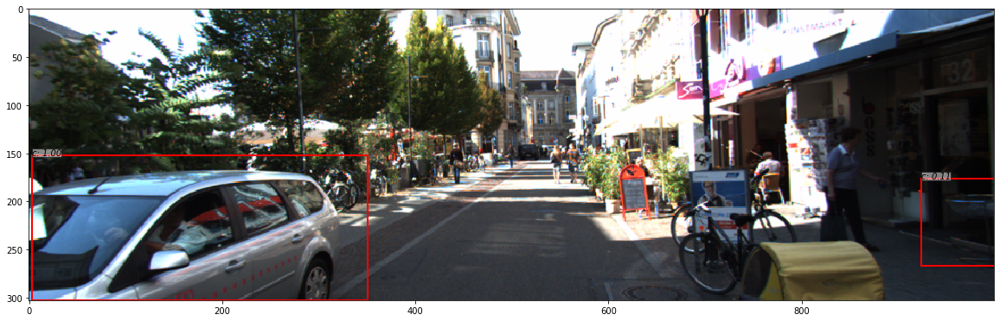

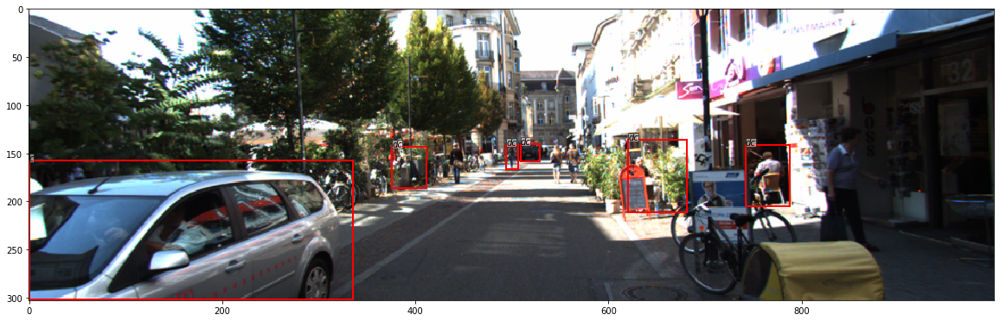

[True, False, True, False, False, False, False, False]


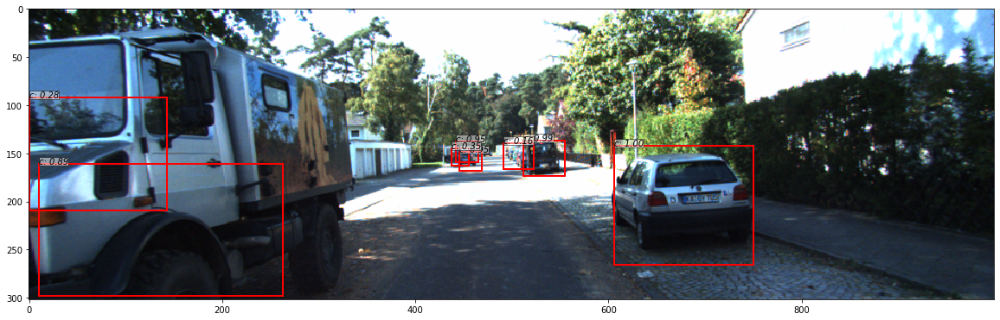

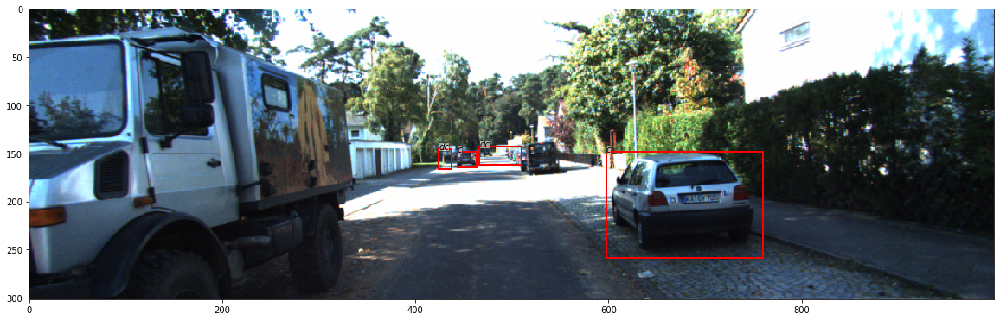

[True]


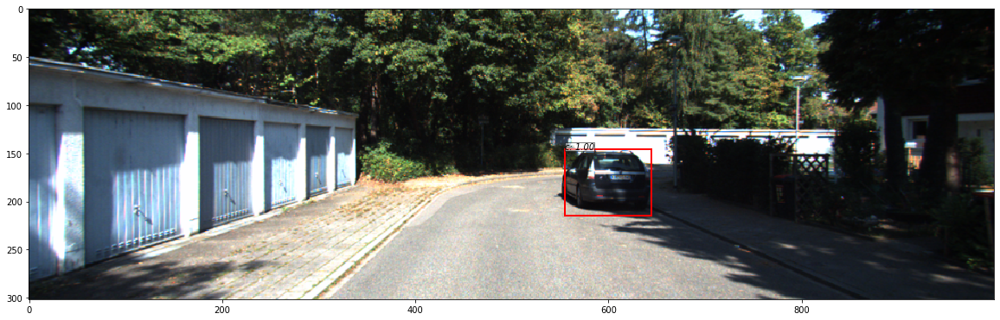

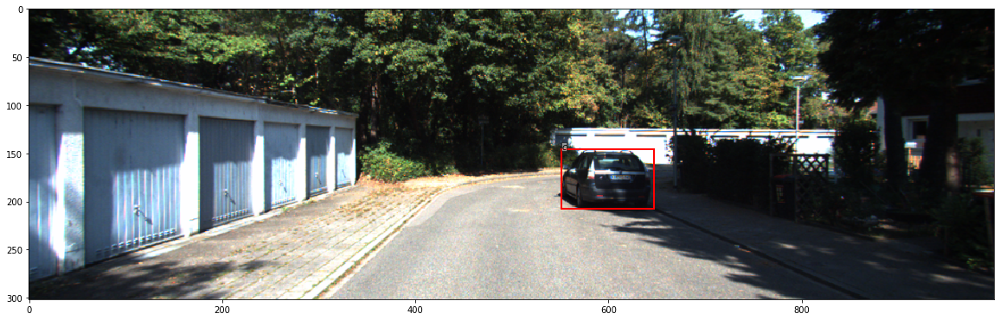

[True, True, True, True, True, False, False, False]


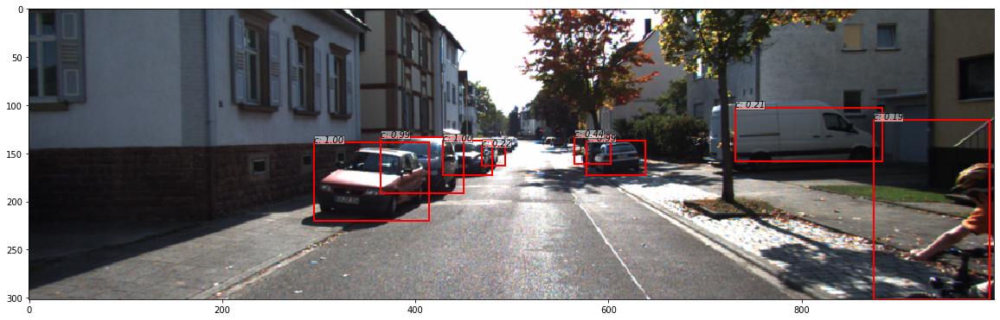

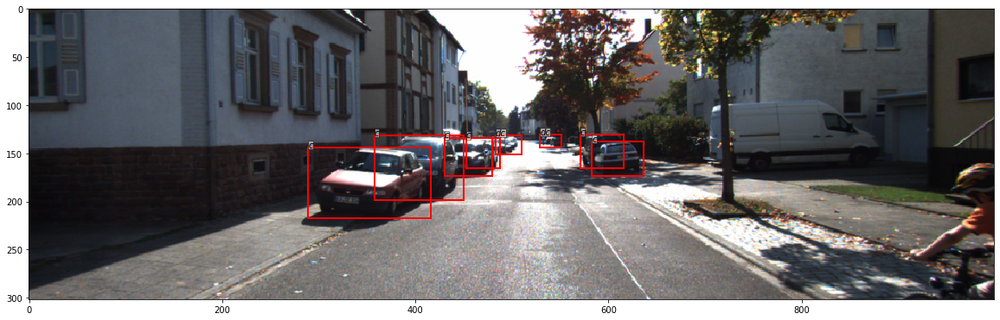

In [27]:
%matplotlib inline

from data.util import  read_image
from utils.vis_tool import vis_bbox, vis_image
from utils import array_tool as at
import numpy as np
import h5py
from tqdm.auto import tqdm
import matplotlib.pyplot as plt
from data.dataset import Dataset, TestDataset, inverse_normalize

def size2scale(imgs, sizes):
    _, H, W = imgs.shape[1:]
    o_H, o_W = sizes
    return o_H / H

TRAIN_MODE = True


i = 0
if TRAIN_MODE:
    for ii, (imgs, sizes, gt_bboxes_, gt_labels_, gt_difficults_) in tqdm(enumerate(test_dataloader), total=len(test_dataset)):
        gt_bboxes += list(gt_bboxes_.numpy())
        gt_labels += list(gt_labels_.numpy())
        
        sizes = [sizes[0][0].item(), sizes[1][0].item()]
        pred_bboxes_, pred_labels_, pred_scores_ = faster_rcnn.predict(imgs, [sizes])
        _, H, W = imgs.shape[1:]
        
        print(overlapping_bboxes[ii])
        
        vis_bbox(inverse_normalize(at.tonumpy(imgs[0])),
                 pred_bboxes_[0] / size2scale(imgs, sizes),
                 pred_labels_[0].reshape(-1),
                 pred_scores_[0].reshape(-1))
        plt.show()
        
        vis_bbox(inverse_normalize(at.tonumpy(imgs[0])),
                 gt_bboxes_[0] / size2scale(imgs, sizes),
                 gt_labels_[0].reshape(-1))
        plt.show() 
        
        i += 1
        if i == 10:
            break

In [60]:
i = 4

In [61]:
overlapping_bboxes[i]

[True, True, True, False, False, False, False, False, False]

In [62]:
pred_labels[i]

array([0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [63]:
gt_labels[i]

array([ 0,  0,  0,  0, -1, -1], dtype=int32)

In [64]:
pred_scores[i]

array([0.9958878 , 0.9937302 , 0.97691274, 0.38402674, 0.26635122,
       0.209949  , 0.14745478, 0.14745478, 0.06912339], dtype=float32)

In [ ]:
# Want false positives
# Can't overlap with dont care box